## Error Correction Spontaneous Magnetization 

Identify and correct systematic biases in DFT-based simulations of spontaneous magnetization (Ms), using a combination of:

- Statistical modeling of error patterns
- AI-driven correction functions
- Data augmentation for missing experimental values

In [1]:
import sys
from pathlib import Path
import os

# Get project root (parent of notebooks/)
PROJECT_ROOT = Path.cwd().parent.resolve()

# Add project root to Python path so src/ is importable
sys.path.insert(0, str(PROJECT_ROOT))

# Change working directory to project root
os.chdir(PROJECT_ROOT)

In [2]:
import yaml

from src.ms_aux import *
from src.load_data import load_data
from src.combine_dataframes import combine_dataframes
from src.augment_data import augment_data_experimental
from src.data_pipeline import run_data_processing_pipeline

### Data Pre-Processing

In [3]:
path_to_config_file = './configs/data_pipeline_ms.yml'

In [4]:
# read config file
with open(path_to_config_file, "r") as f:
    config = yaml.safe_load(f)   

In [5]:
config

{'experiment': 'data_pipeline_ms',
 'config_path': 'configs/data_pipeline_ms.yml',
 'DATA_DIR': 'data/',
 'TO_AUGMENT': 'data/merged_df_no_Ms_leq_50000.csv',
 'threshold': 50000.0,
 'SAVE_AUGMENTED_DATA': 'data/merged_dfs_augmented_exp.csv',
 'sim_col': 'Ms (ampere/meter)_s',
 'exp_col': 'Ms (ampere/meter)_e',
 'artifact_paths': {'root': 'artifacts/',
  'data_plots': 'artifacts/data_plots/'}}

In [6]:
run_data_processing_pipeline(config)

loading oqmd ...
loading literature ...
loading bhandari_i ...
loading bhandari_xii ...
loading bhandari_xiii ...
loading magnetic_materials_exp ...
loading magnetic_materials_sim ...
Loading done!
Number of rows with both experimental and simulation values: 6978
Combined DF saved to: data/merged_df_python.csv
Nr of simulated values: 157555
Nr of experimental values: 11996
Combined DF RE Materials: 76114
Combined DF RE-Free Materials: 86459
Shape combined dataframe from different data sources: 162573
------------ Remove small Ms values ------------
Shape DF after rm small Ms values: 58599
Nr RE Materials after rm small Ms values: 20367
Nr RE-Free Materials after rm small Ms values: 38232
------------ Create Pairwise Dataset without small Ms values ------------
Shape Pairwise DF: 4225
Thresholded Pairwise DF saved to: data/pairwise_df_no_Ms_leq_50000.csv


### Augment Data

In [7]:
augment_data_experimental(config)

------ Augment experimental values ------
Pairs All Materials: 4225
Pair RE Materials 896
Pair RE-Free Materials 3329
-------------------------------------------------------------------------
Before mock data generation, exp-val NaNs in ALL: 50444
Before mock data generation, exp-val NaNs in RE: 18501
Before mock data generation, exp-val NaNs in RE-Free: 31943
-------------------------------------------------------------------------
Number of measured experimental values before mock data generation:
ALL: 8155
RE: 1866
RE-Free: 0
-------------------------------------------------------------------------
Number of duplicate rows: 0
Shape df_augmented: 54669
RE-Materials after augmentation: 19397
RE-Free Materials after augmentation: 35272


### Model Training
Linear regression (LR) models, a random forest (RF), the LASSO regression, and a fully connected neural network (FCNN) have been developed.

In [8]:
%%capture
from src.run_experiments import run_all_experiments

#### Scikit-Models

Running model: LinearRegression
➤ Dataset: all
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
➤ Dataset: re
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
➤ Dataset: re_free
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
Running model: Ridge
➤ Dataset: all
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best hyperparameters for Ridge: {'alpha': 0.001, 'fit_intercept': True, 'solver': 'auto'}
➤ Dataset: re
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best hyperparameters for Ridge: {'alpha': 0.001, 'fit_intercept': True, 'solver': 'auto'}
➤ Dataset: re_free
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best hyperparameters for Ridge: {'alpha': 0.001, 'fit_inter

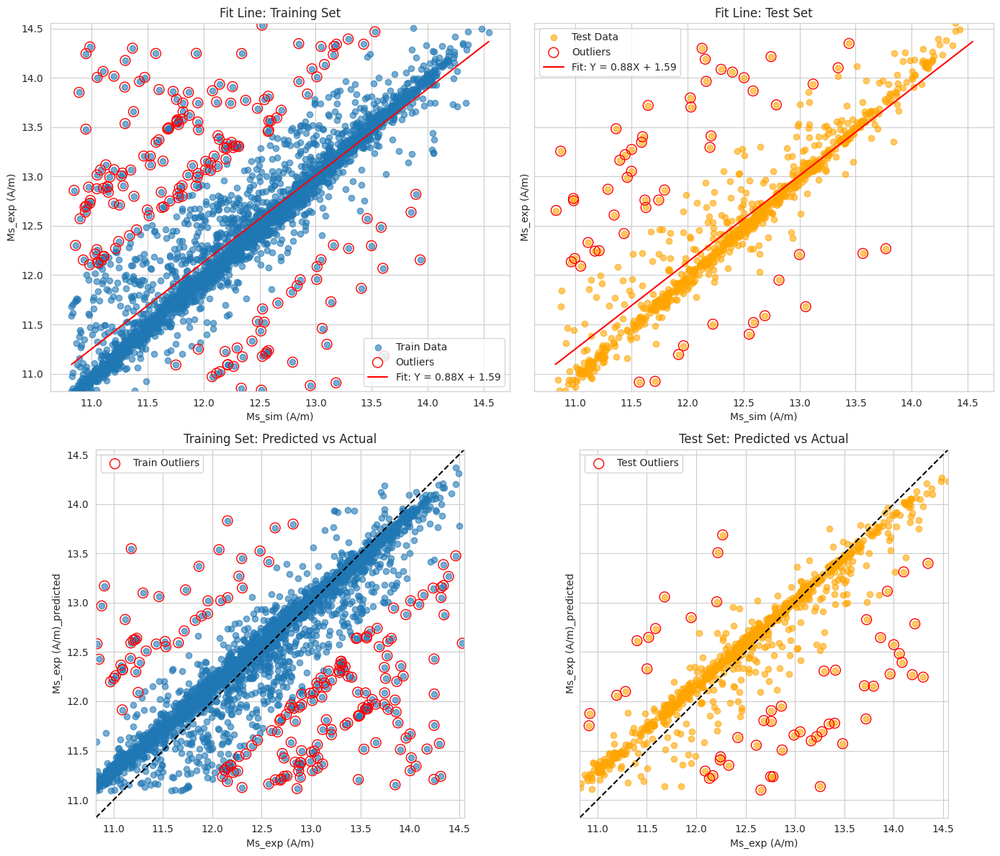

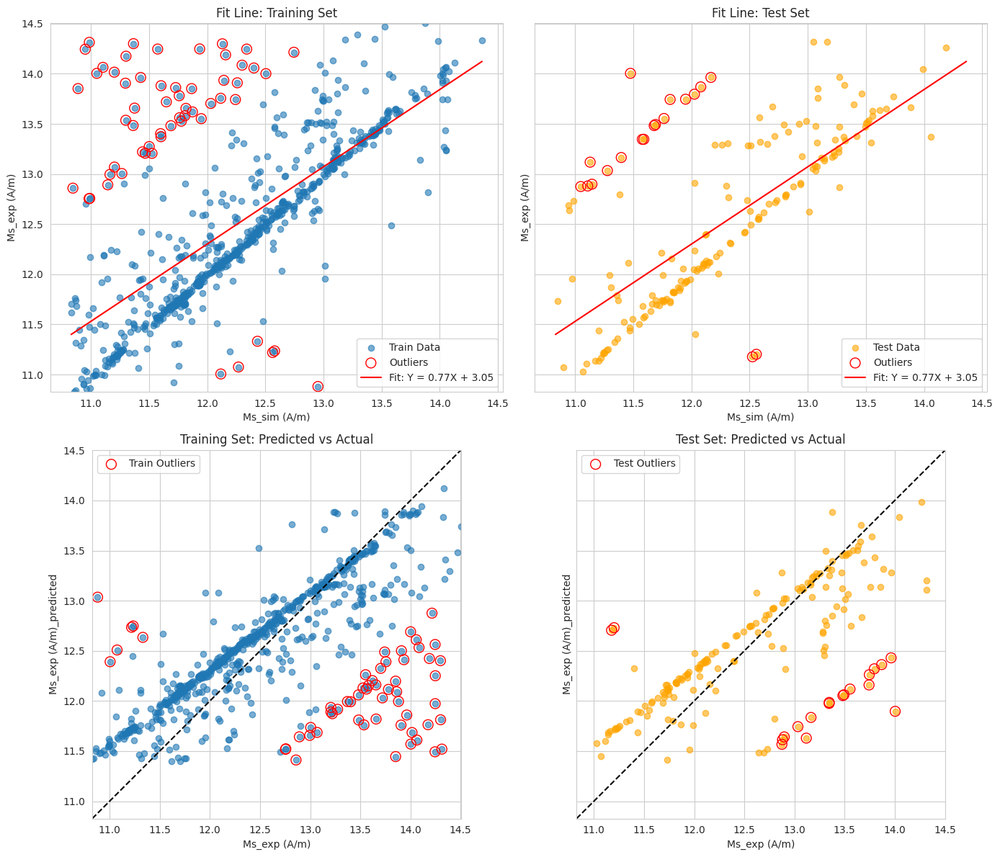

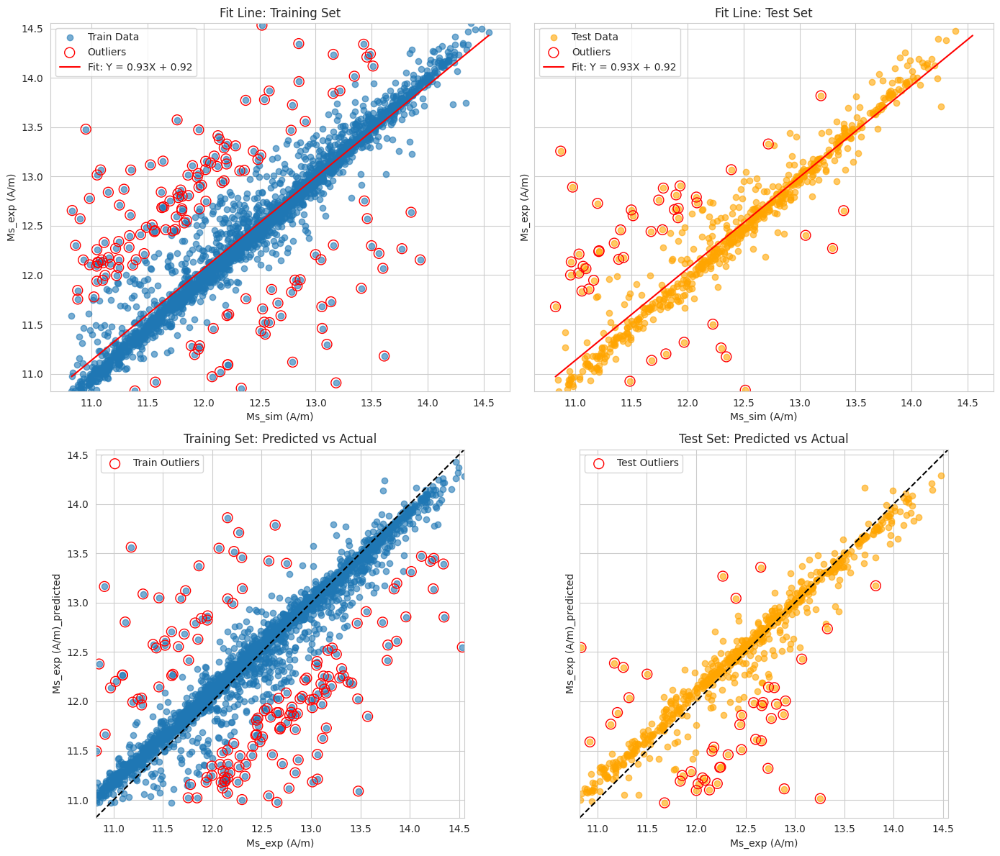

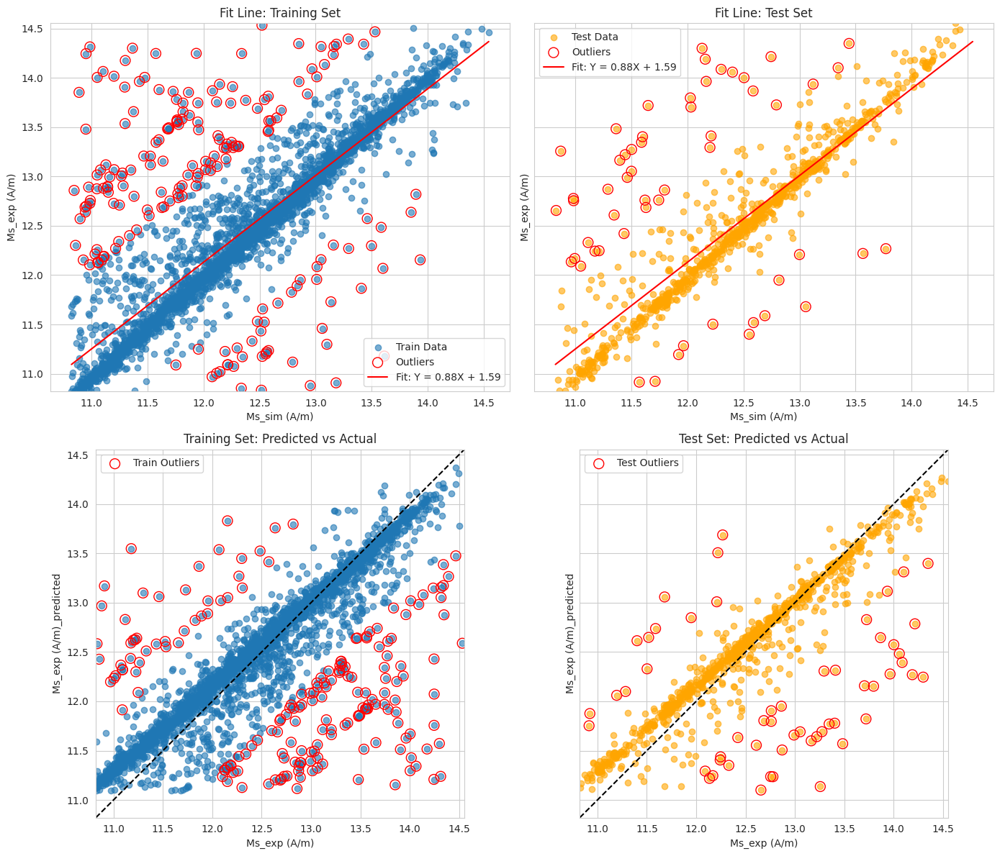

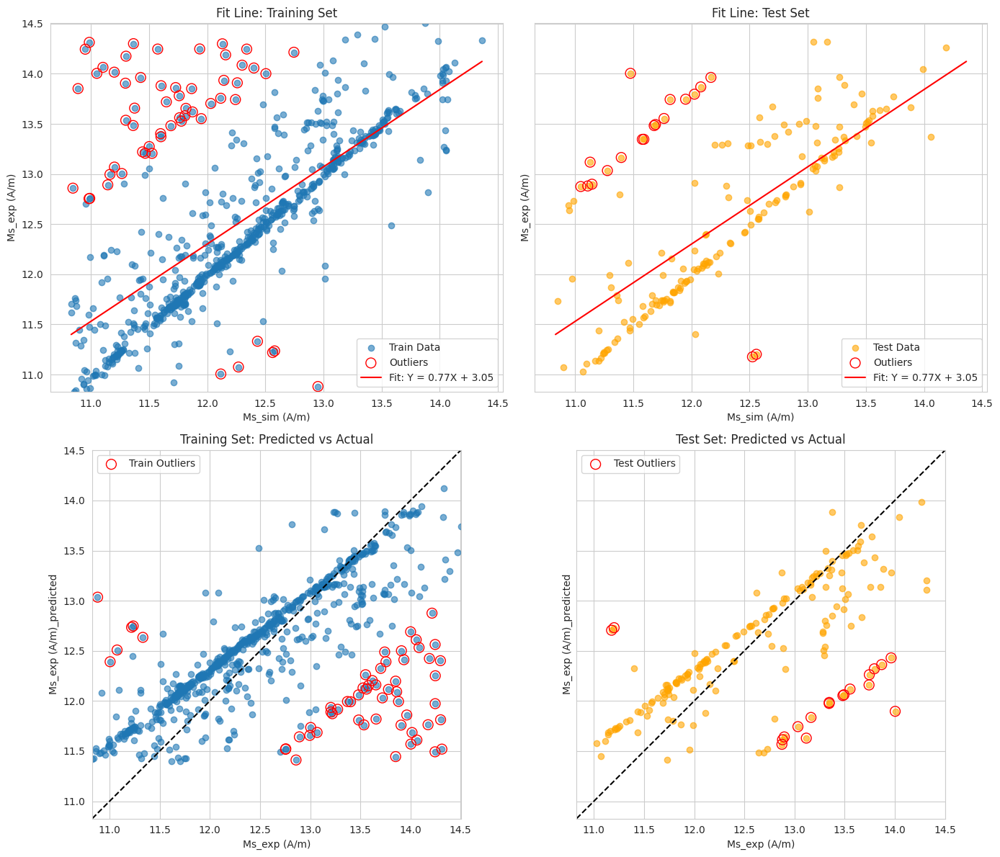

...

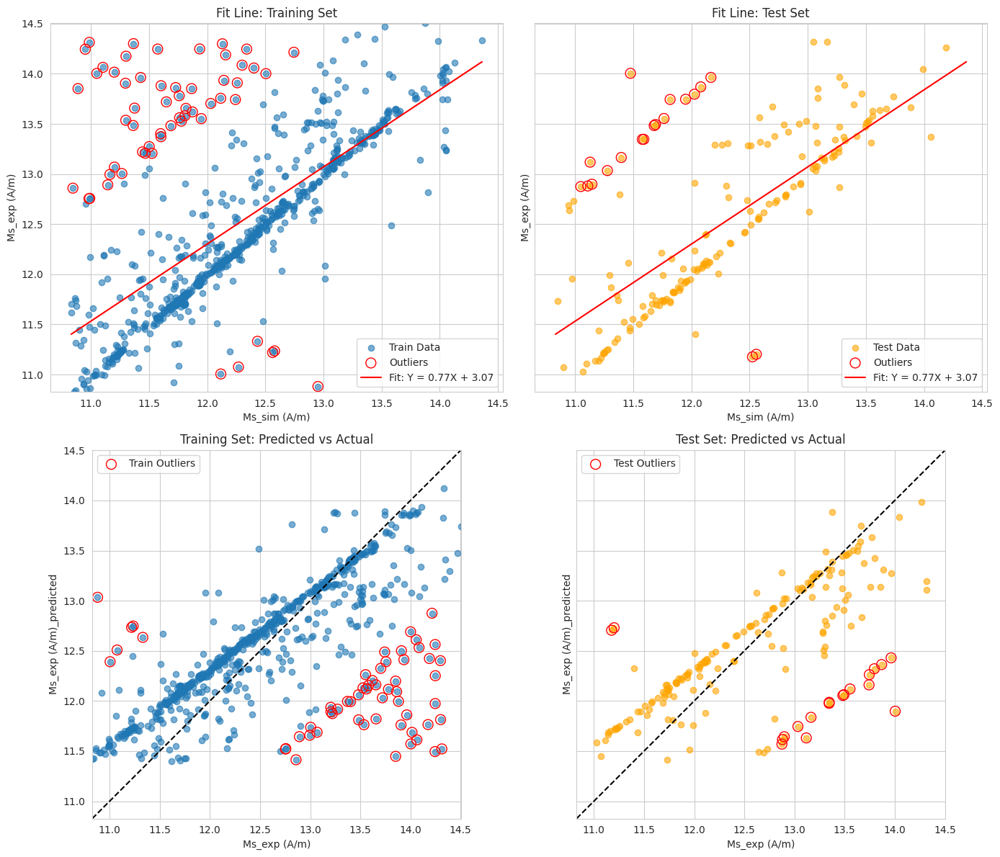

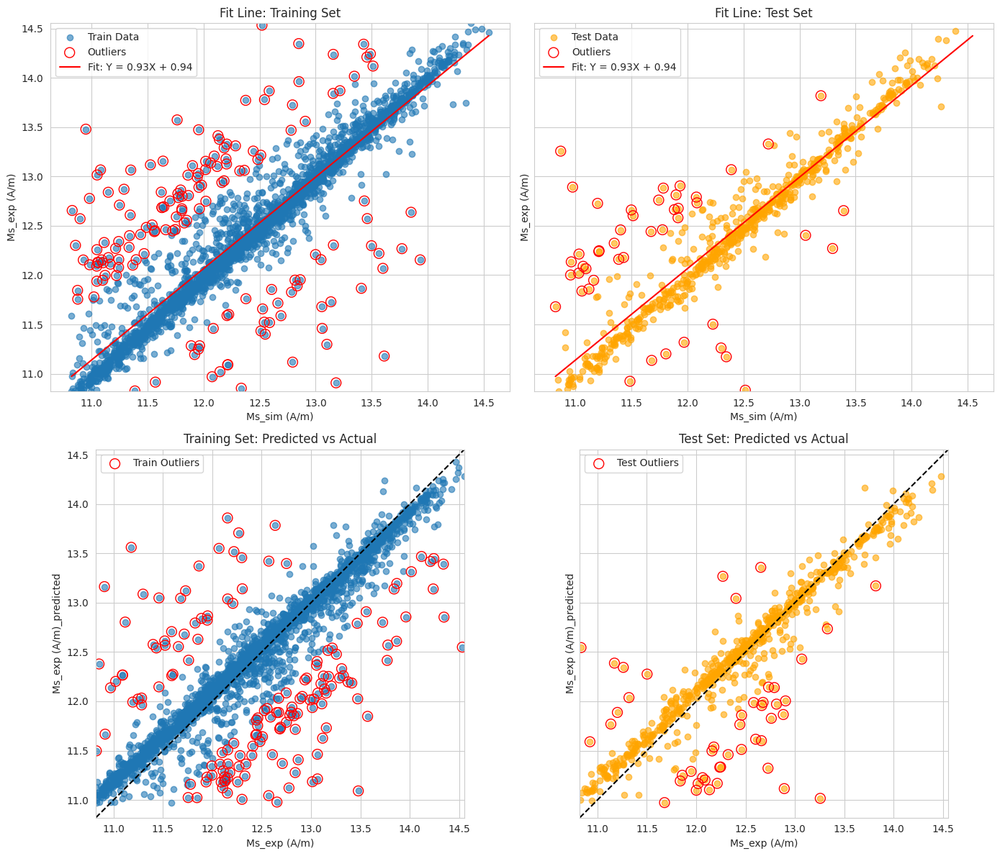

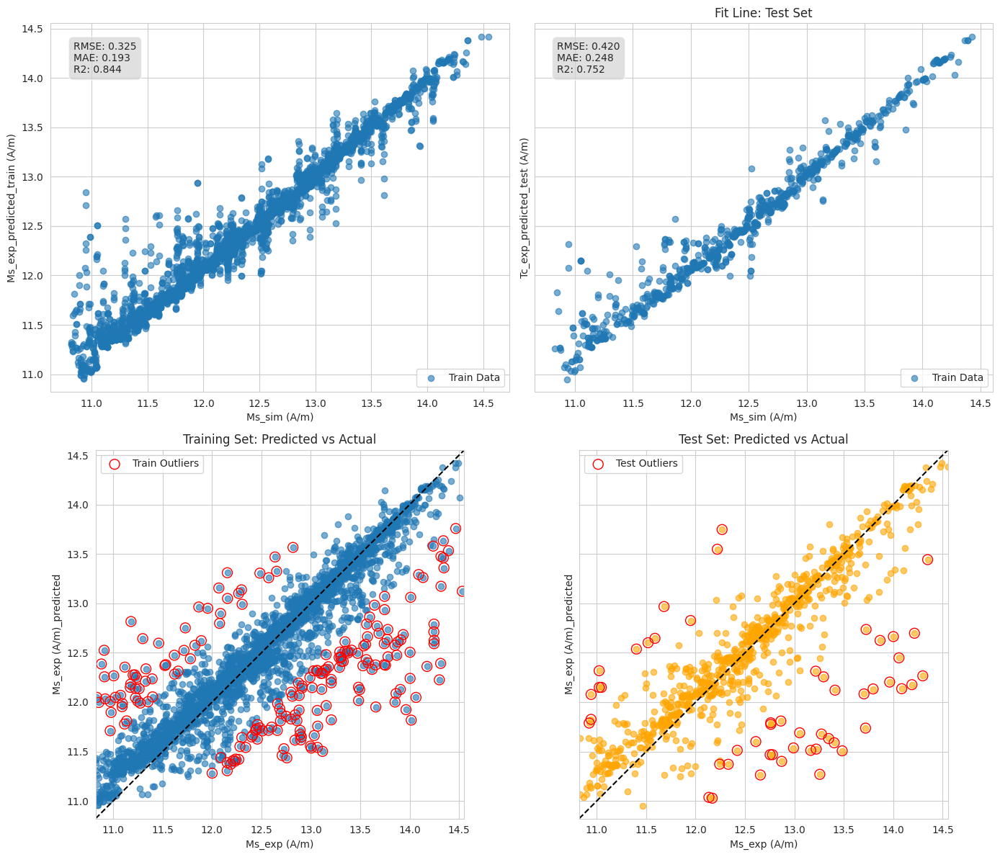

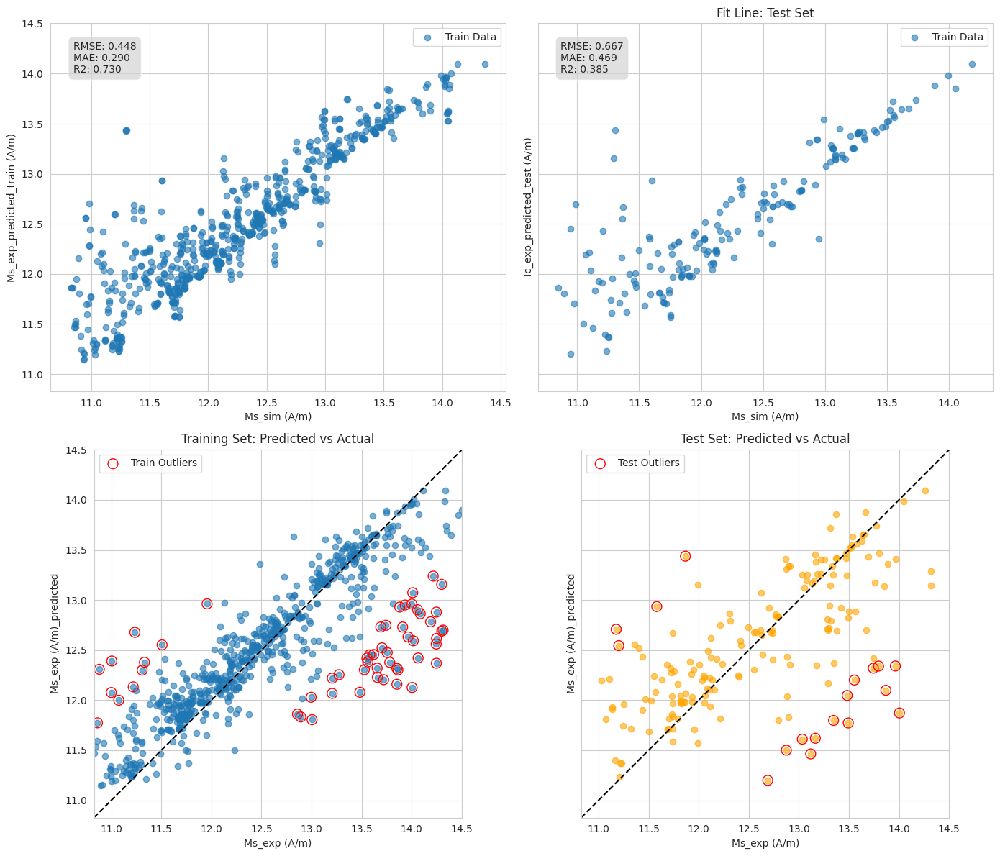

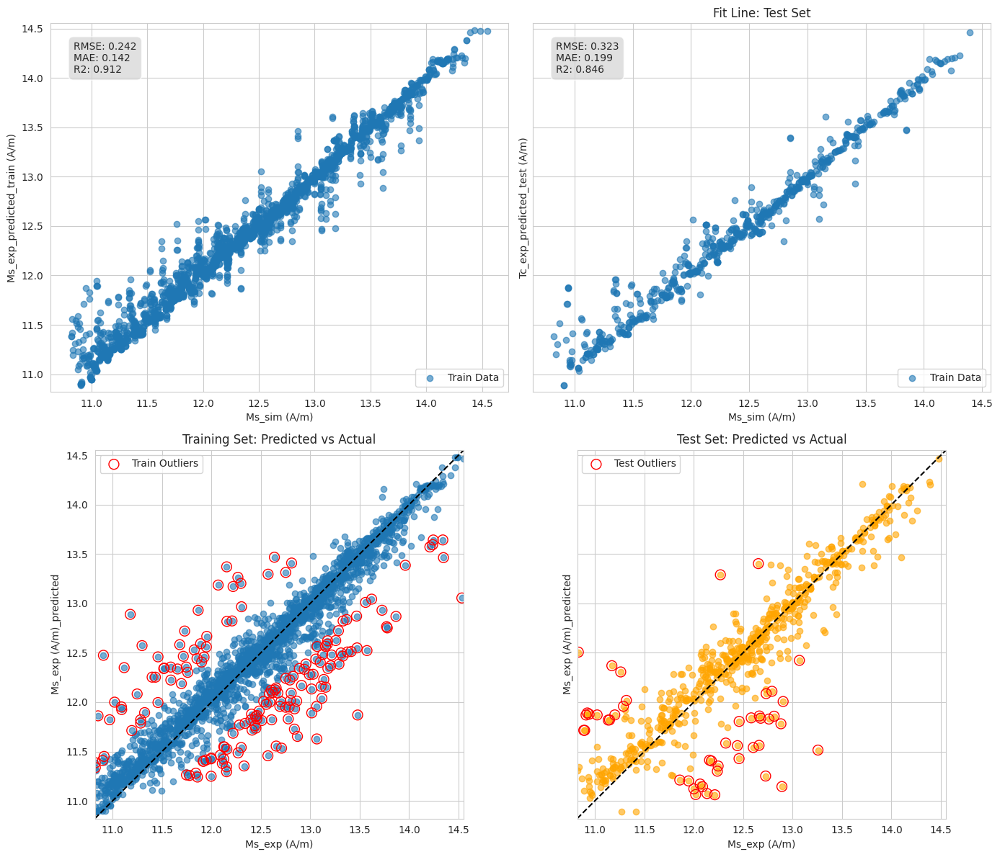

In [9]:
scikit_configfile_path = 'configs/scikit_models_config.yml'

with open(scikit_configfile_path, "r") as f:
    scikit_config = yaml.safe_load(f)   

run_all_experiments(config=scikit_config);

#### Symbolic Regression

In [10]:
pysr_configfile_path = 'configs/pysr_linear_models_config.yml'

with open(pysr_configfile_path, "r") as f:
    pysr_config = yaml.safe_load(f)   

run_all_experiments(config=pysr_config);

Running model: symbolic_regression
➤ Dataset: all


/home/christina-winkler/Documents/ML-models/experimental-simulation-tc/mammos-tc/lib/python3.12/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(


➤ Dataset: re


/home/christina-winkler/Documents/ML-models/experimental-simulation-tc/mammos-tc/lib/python3.12/site-packages/pysr/sr.py:2217: UserWarning: The discovered expressions are being reset. Please set `warm_start=True` if you wish to continue to start a search where you left off.
  warnings.warn(
/home/christina-winkler/Documents/ML-models/experimental-simulation-tc/mammos-tc/lib/python3.12/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(


➤ Dataset: re_free


/home/christina-winkler/Documents/ML-models/experimental-simulation-tc/mammos-tc/lib/python3.12/site-packages/pysr/sr.py:2217: UserWarning: The discovered expressions are being reset. Please set `warm_start=True` if you wish to continue to start a search where you left off.
  warnings.warn(
/home/christina-winkler/Documents/ML-models/experimental-simulation-tc/mammos-tc/lib/python3.12/site-packages/pysr/sr.py:2811: UserWarning: Note: it looks like you are running in Jupyter. The progress bar will be turned off.
  warnings.warn(



 All experiments completed. Log saved to:
 artifacts/experiment-log_sim2exp-pysr_linear-2026-02-11T16-13-48/result_logs.yml


#### Multi-Layer Perceptron

In [11]:
mlp_configfile_path = 'configs/pytorch_mlp_config.yml'

with open(mlp_configfile_path, "r") as f:
    mlp_config = yaml.safe_load(f)   

run_all_experiments(config=mlp_config);

Running model: pytorch_mlp
➤ Dataset: all

Best architecture: None
Best params: None
Best val loss: inf
Best metrics: None
Epoch [0/2000], Train Loss: 132.1484, Val Loss: 116.0717
Epoch [1/2000], Train Loss: 115.5735, Val Loss: 100.8233
Epoch [2/2000], Train Loss: 100.3785, Val Loss: 87.2574
Epoch [3/2000], Train Loss: 86.8636, Val Loss: 74.9022
Epoch [4/2000], Train Loss: 74.5565, Val Loss: 63.6879
Epoch [5/2000], Train Loss: 63.3855, Val Loss: 53.4676
Epoch [6/2000], Train Loss: 53.2064, Val Loss: 44.4251
Epoch [7/2000], Train Loss: 44.2003, Val Loss: 36.7557
Epoch [8/2000], Train Loss: 36.5618, Val Loss: 30.2254
Epoch [9/2000], Train Loss: 30.0600, Val Loss: 24.3776
Epoch [10/2000], Train Loss: 24.2385, Val Loss: 19.1767
Epoch [11/2000], Train Loss: 19.0621, Val Loss: 14.6296
Epoch [12/2000], Train Loss: 14.5376, Val Loss: 10.7377
Epoch [13/2000], Train Loss: 10.6664, Val Loss: 7.4973
Epoch [14/2000], Train Loss: 7.4448, Val Loss: 4.8956
Epoch [15/2000], Train Loss: 4.8598, Val Loss

#### Scikit models with composition embedding

Embedding compositions: 100%|██████████| 4225/4225 [00:01<00:00, 2775.60it/s]



 Embedding generation complete.
Successes: 4225
Failures: 0
Missing embeddings in dataframe: 0
Running model: LinearRegression
➤ Dataset: all
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
➤ Dataset: re
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
➤ Dataset: re_free
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best hyperparameters for LinearRegression: {'fit_intercept': True, 'positive': True}
Running model: Ridge
➤ Dataset: all
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best hyperparameters for Ridge: {'alpha': 0.001, 'fit_intercept': True, 'solver': 'auto'}
➤ Dataset: re
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best hyperparameters for Ridge: {'alpha': 0.004, 'fit_intercept': True, 'solver': 'auto'}
➤ Dataset: re_free
Fitting 3 folds for eac

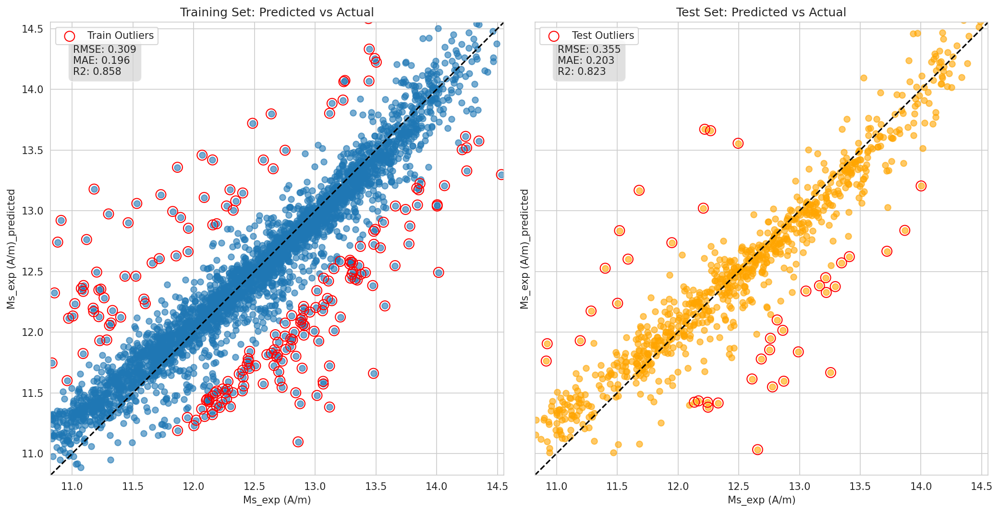

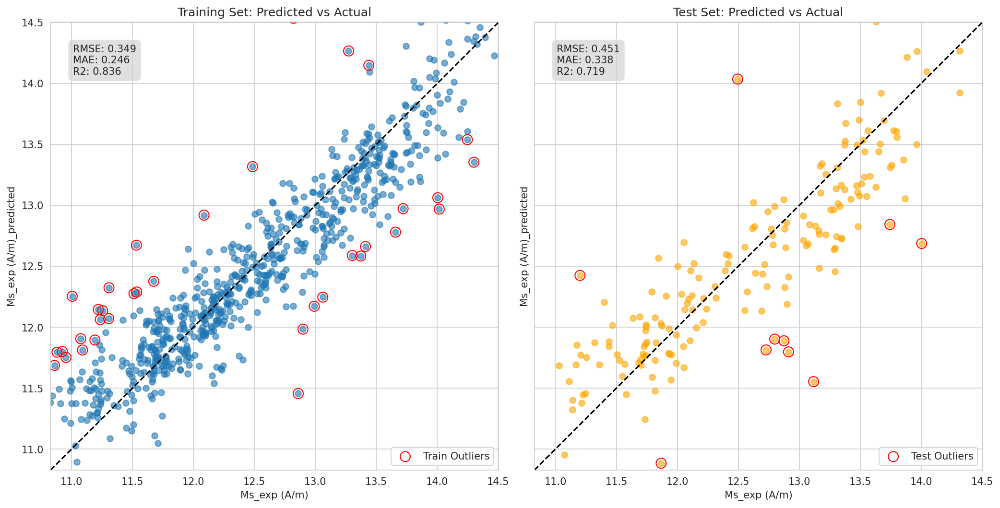

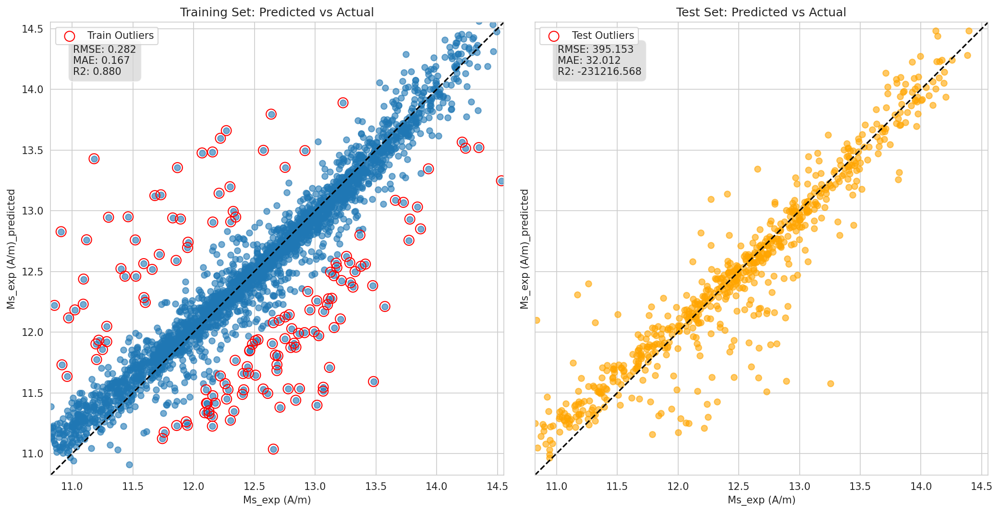

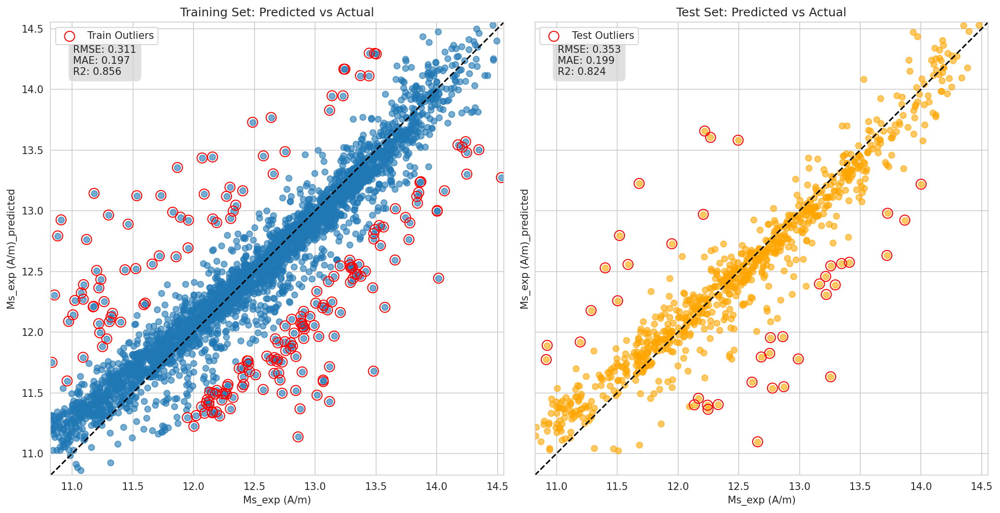

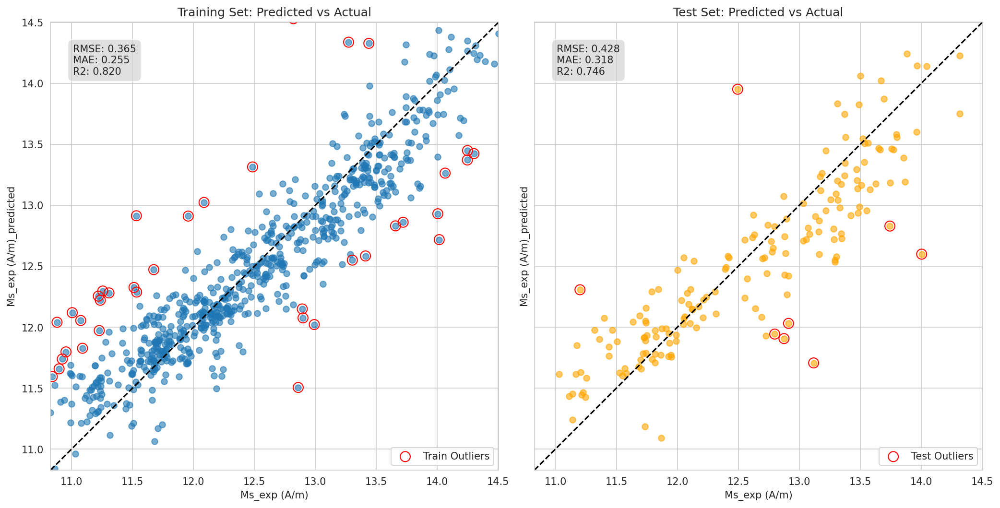

...

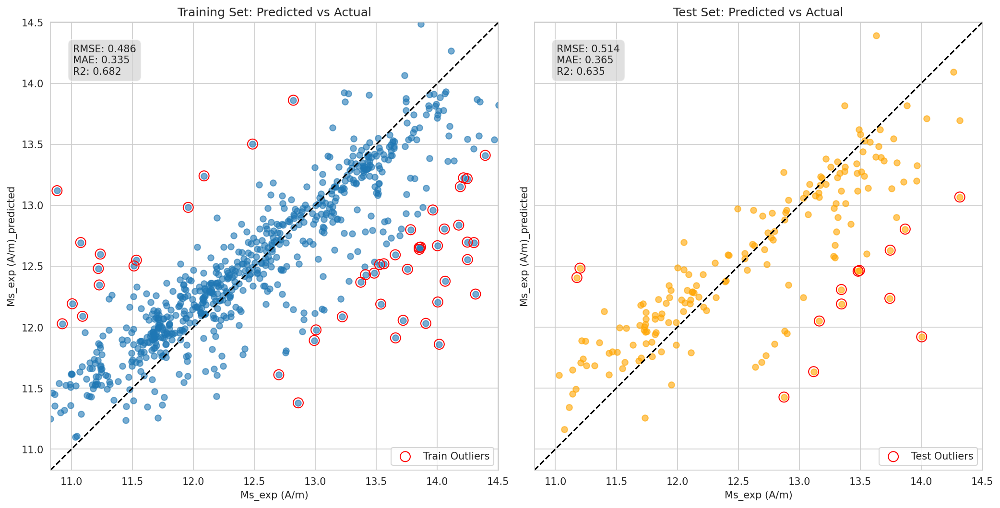

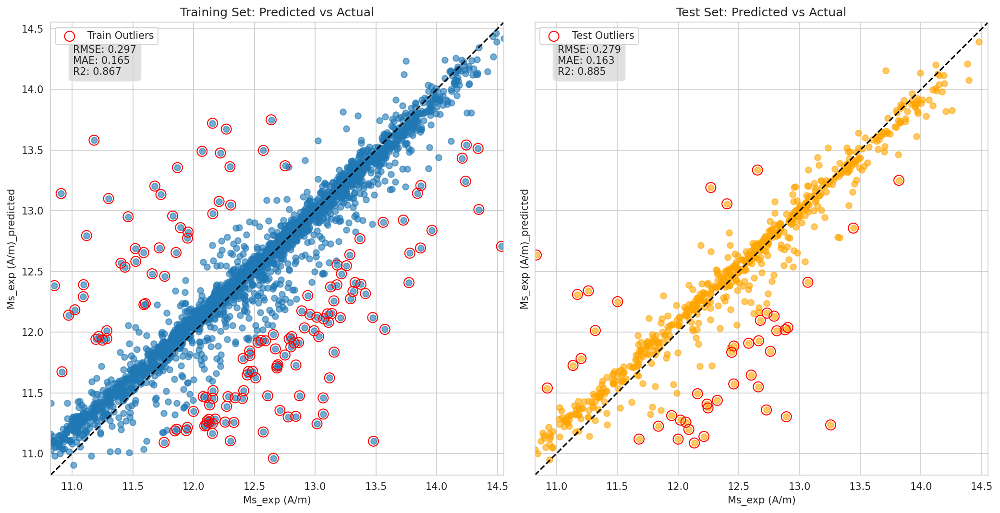

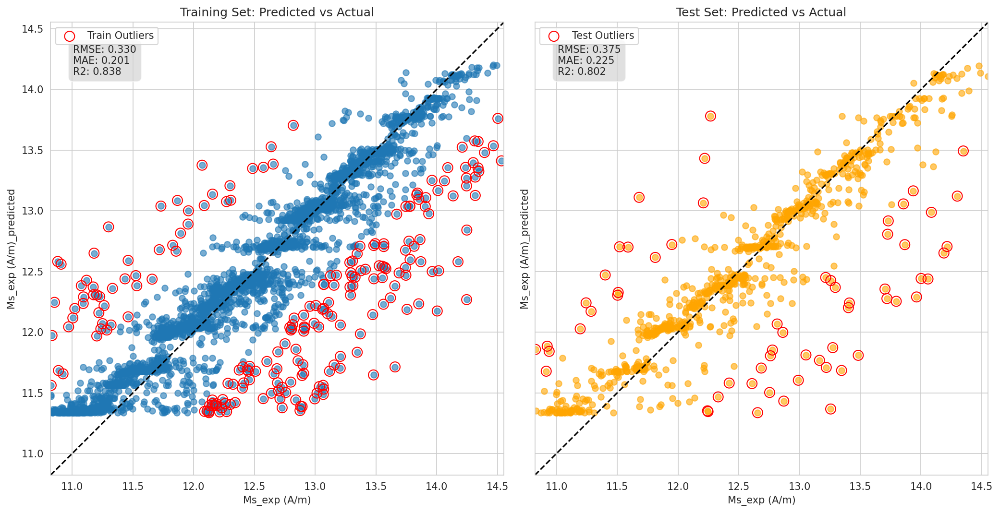

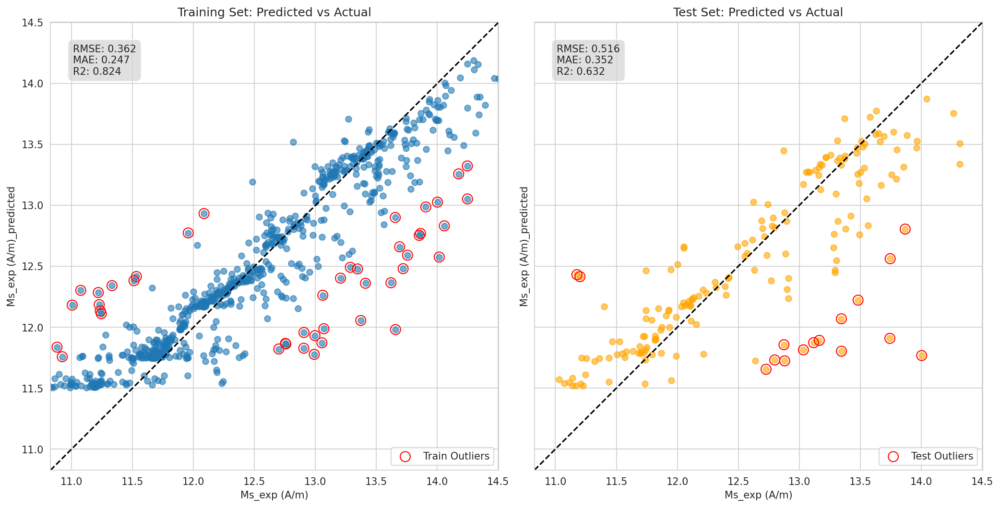

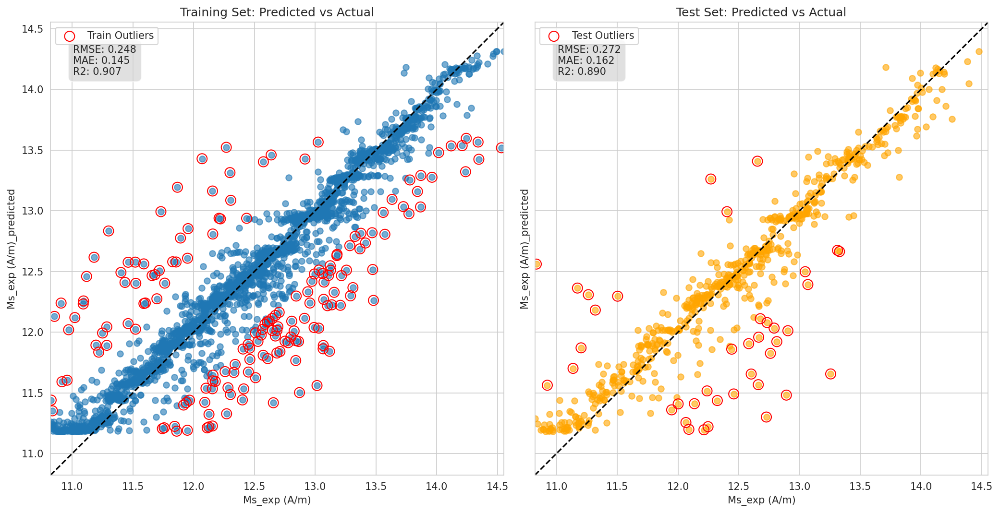

In [12]:
scikit_w_embd_configfile_path = 'configs/scikit_models_w_mat200_config.yml'

with open(scikit_w_embd_configfile_path, "r") as f:
    scikit_w_embd_config = yaml.safe_load(f)   
    
run_all_experiments(config=scikit_w_embd_config);

#### Multi-Layer Perceptron with composition embedding

In [13]:
mlp_w_embd_configfile_path = 'configs/pytorch_mlp_w_emb_config.yml'

with open(mlp_w_embd_configfile_path, "r") as f:
    mlp_w_embd_config = yaml.safe_load(f)   
    
run_all_experiments(config=mlp_w_embd_config);

Embedding compositions: 100%|██████████| 4225/4225 [00:01<00:00, 2404.62it/s]



 Embedding generation complete.
Successes: 4225
Failures: 0
Missing embeddings in dataframe: 0
Running model: pytorch_mlp
➤ Dataset: all

Best architecture: None
Best params: None
Best val loss: inf
Best metrics: None
Epoch [0/2000], Train Loss: 158.0302, Val Loss: 157.5262
Epoch [1/2000], Train Loss: 156.8849, Val Loss: 156.3716
Epoch [2/2000], Train Loss: 155.7346, Val Loss: 155.2126
Epoch [3/2000], Train Loss: 154.5803, Val Loss: 154.0487
Epoch [4/2000], Train Loss: 153.4209, Val Loss: 152.8854
Epoch [5/2000], Train Loss: 152.2626, Val Loss: 151.7647
Epoch [6/2000], Train Loss: 151.1455, Val Loss: 150.6806
Epoch [7/2000], Train Loss: 150.0640, Val Loss: 149.6699
Epoch [8/2000], Train Loss: 149.0574, Val Loss: 148.6398
Epoch [9/2000], Train Loss: 148.0314, Val Loss: 147.5790
Epoch [10/2000], Train Loss: 146.9743, Val Loss: 146.4566
Epoch [11/2000], Train Loss: 145.8561, Val Loss: 145.2557
Epoch [12/2000], Train Loss: 144.6605, Val Loss: 143.9737
Epoch [13/2000], Train Loss: 143.3839